In [1]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()


# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog,DatasetCatalog


/home/xuyifei/anaconda3/envs/detectron2/lib/python3.7/site-packages/google/colab/data_table.py:30: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  from IPython.utils import traitlets as _traitlets


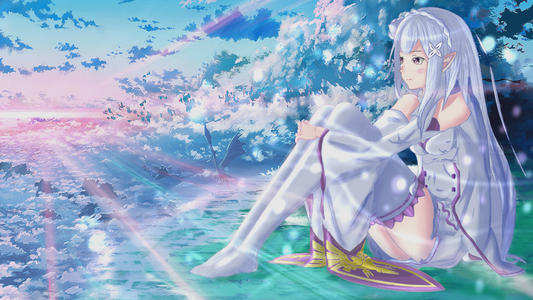

tensor([0], device='cuda:0')
Boxes(tensor([[258.1752,   6.9156, 518.7419, 283.1346]], device='cuda:0'))


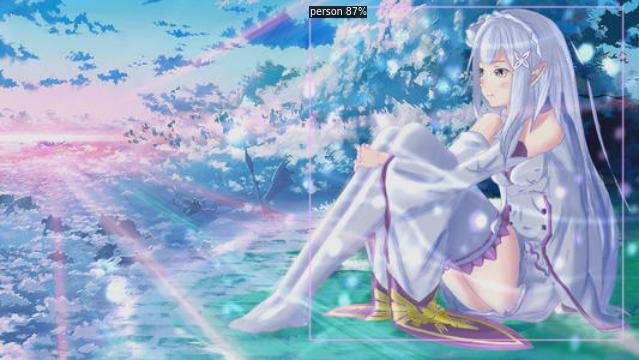

In [3]:
#We can use `Visualizer` to draw the predictions on the image.
#---------------------------------
#This is a test before training.
#---------------------------------
im = cv2.imread("Pics/EMT/873ec2bd70a3c514860dca8c15faab22.jpg")
cv2_imshow(im)


cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = "Coco/configs/COCO-Detection/faster_rcnn_R_50_FPN_1x/137257794/model_final_b275ba.pkl"
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])



In [4]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

import os
import numpy as np
import json
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.data.datasets import load_coco_json
print(detectron2.data.datasets.__file__)
print(os.getcwd())
register_coco_instances("coco_train_2", {}, "./Coco/detectron2/datasets/coco/annotations/instances_train.json", "./Coco/detectron2/datasets/coco/train")
register_coco_instances("coco_val_2", {}, "./Coco/detectron2/datasets/coco/annotations/instances_val.json", "./Coco/detectron2/datasets/coco/val")




/home/xuyifei/anaconda3/envs/detectron2/lib/python3.7/site-packages/detectron2/data/datasets/__init__.py
/home/xuyifei/桌面/jupter env/Try_2


[07/10 12:35:13 d2.data.datasets.coco]: Loaded 500 images in COCO format from ./Coco/detectron2/datasets/coco/annotations/instances_train.json
[{'file_name': './Coco/detectron2/datasets/coco/train/_20191031090107_0_4.jpg', 'height': 1080, 'width': 1920, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [742.0, 112.0, 117.0, 224.0], 'category_id': 1, 'segmentation': [[742.6585365853658, 112.58536585365852, 742.6585365853658, 336.9756097560975, 859.7317073170731, 336.9756097560975, 859.7317073170731, 112.58536585365852]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}, {'file_name': './Coco/detectron2/datasets/coco/train/_20191101080935_0_3.jpg', 'height': 1080, 'width': 1920, 'image_id': 2, 'annotations': [{'iscrowd': 0, 'bbox': [582.0, 123.0, 102.0, 187.0], 'category_id': 1, 'segmentation': [[582.9024390243902, 123.56097560975607, 582.9024390243902, 310.1463414634146, 684.1219512195122, 310.1463414634146, 684.1219512195122, 123.56097560975607]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrow

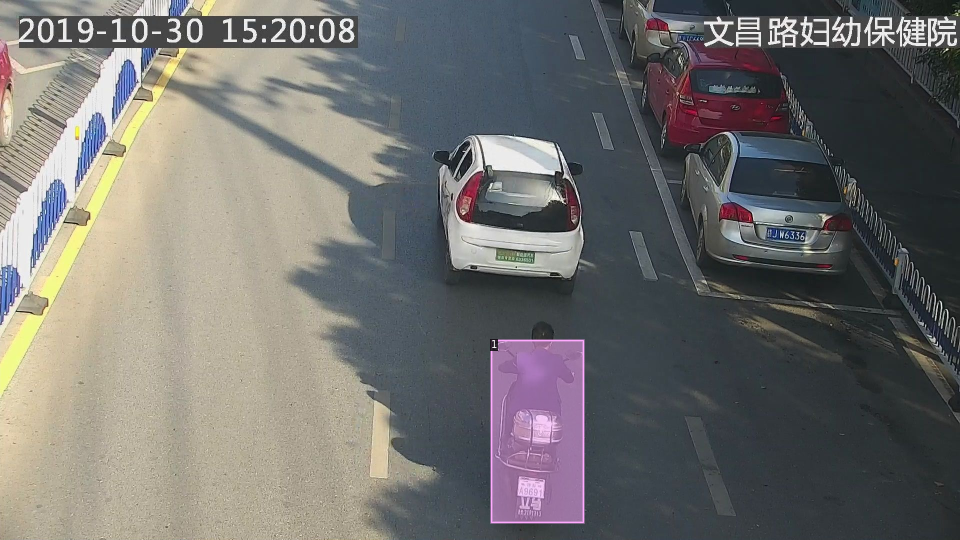

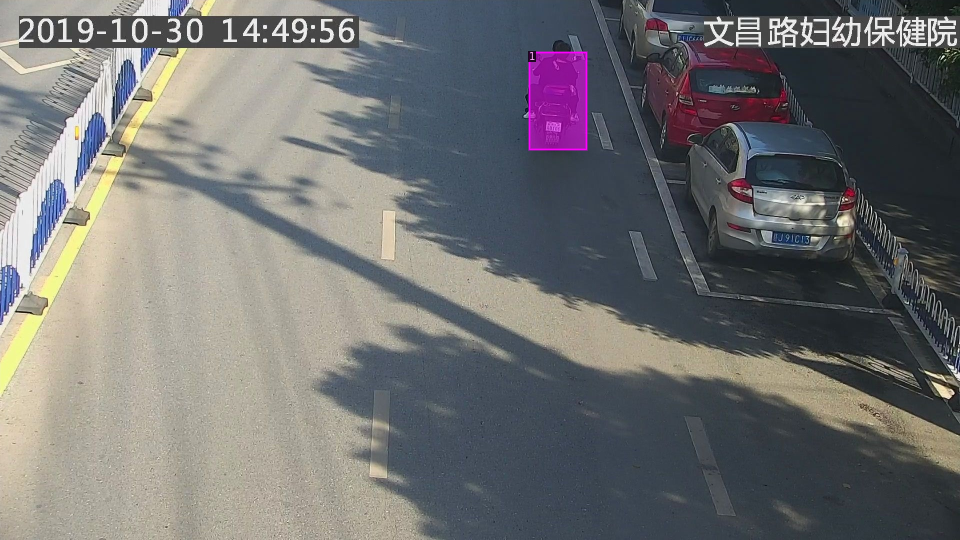

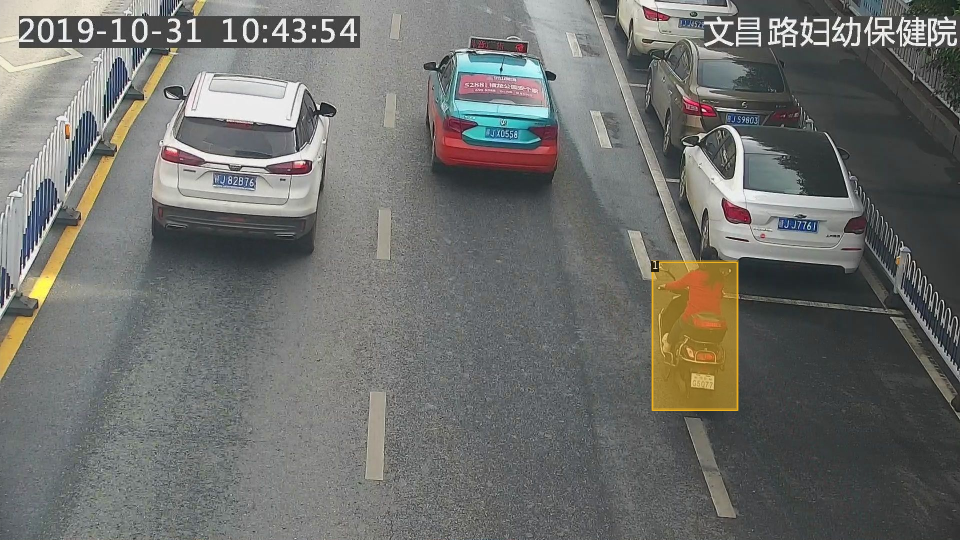

In [5]:
# import random
#from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import builtin,load_coco_json
dataset_dicts = load_coco_json("./Coco/detectron2/datasets/coco/annotations/instances_train.json", "./Coco/detectron2/datasets/coco/train")
print(dataset_dicts)
coco_train_metadata=MetadataCatalog.get("coco_train_2")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=coco_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])


In [7]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
# print(os.getcwd())
#os.chdir(r"/home/xuyifei/anaconda3/envs/detectron2/lib/python3.7/site-packages/detectron2")
print(os.getcwd())
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("coco_train_2",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml")  # Let training initialize from model zoo
cfg.MODEL.WEIGHTS = "./Coco/configs/COCO-Detection/faster_rcnn_R_50_FPN_1x/137257794/model_final_b275ba.pkl"
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # how many classes

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
print(cfg.OUTPUT_DIR)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()


/home/xuyifei/桌面/jupter env/Try_2
./output
[07/10 12:36:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=

('coco_train_2',)
coco_train_2
[07/10 12:36:10 d2.data.datasets.coco]: Loaded 500 images in COCO format from ./Coco/detectron2/datasets/coco/annotations/instances_train.json
[07/10 12:36:10 d2.data.build]: Removed 0 images with no usable annotations. 500 images left.
[07/10 12:36:10 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| motorcycle | 830          |
|            |              |
[07/10 12:36:10 d2.data.common]: Serializing 500 elements to byte tensors and concatenating them all ...
[07/10 12:36:11 d2.data.common]: Serialized dataset takes 0.22 MiB
[07/10 12:36:11 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[07/10 12:36:11 d2.data.build]: Using training sampler TrainingSampler


Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model!


[07/10 12:36:11 d2.engine.train_loop]: Starting training from iteration 0
[07/10 12:36:22 d2.utils.events]:  eta: 0:02:08  iter: 19  total_loss: 1.179  loss_cls: 0.645  loss_box_reg: 0.508  loss_rpn_cls: 0.020  loss_rpn_loc: 0.006  time: 0.4594  data_time: 0.0253  lr: 0.000005  max_mem: 2802M
[07/10 12:36:30 d2.utils.events]:  eta: 0:01:57  iter: 39  total_loss: 1.129  loss_cls: 0.615  loss_box_reg: 0.501  loss_rpn_cls: 0.018  loss_rpn_loc: 0.005  time: 0.4510  data_time: 0.0031  lr: 0.000010  max_mem: 2802M
[07/10 12:36:40 d2.utils.events]:  eta: 0:01:49  iter: 59  total_loss: 1.213  loss_cls: 0.562  loss_box_reg: 0.625  loss_rpn_cls: 0.017  loss_rpn_loc: 0.011  time: 0.4538  data_time: 0.0028  lr: 0.000015  max_mem: 2802M
[07/10 12:36:49 d2.utils.events]:  eta: 0:01:41  iter: 79  total_loss: 1.125  loss_cls: 0.493  loss_box_reg: 0.595  loss_rpn_cls: 0.016  loss_rpn_loc: 0.007  time: 0.4535  data_time: 0.0030  lr: 0.000020  max_mem: 2802M
[07/10 12:36:58 d2.utils.events]:  eta: 0:01:3

In [7]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

tensor([0, 0, 0], device='cuda:0')
Boxes(tensor([[ 945.8373,   41.0385, 1035.9626,  232.3896],
        [1413.1515,  650.2208, 1653.5896, 1022.2961],
        [ 728.9203,   25.1375,  816.5378,  135.9451]], device='cuda:0'))


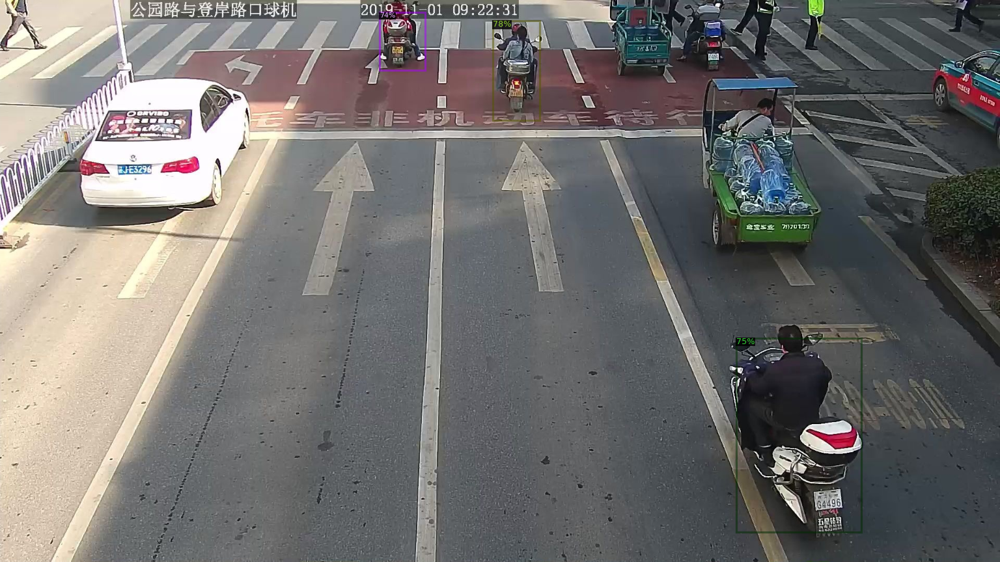

tensor([0], device='cuda:0')
Boxes(tensor([[1026.7543,  108.4020, 1144.0985,  335.9032]], device='cuda:0'))


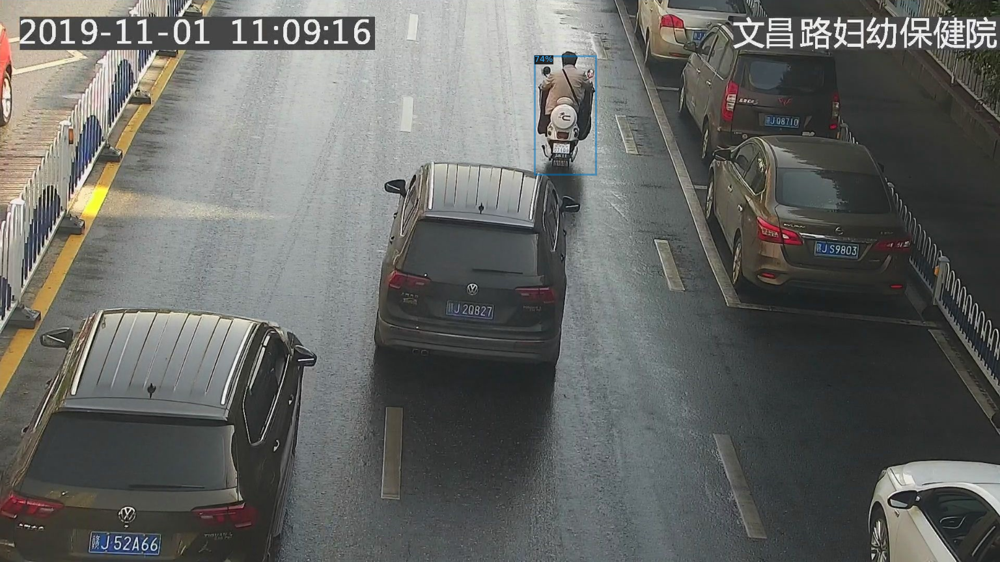

tensor([0], device='cuda:0')
Boxes(tensor([[ 951.3601,  131.0135, 1054.9175,  347.6962]], device='cuda:0'))


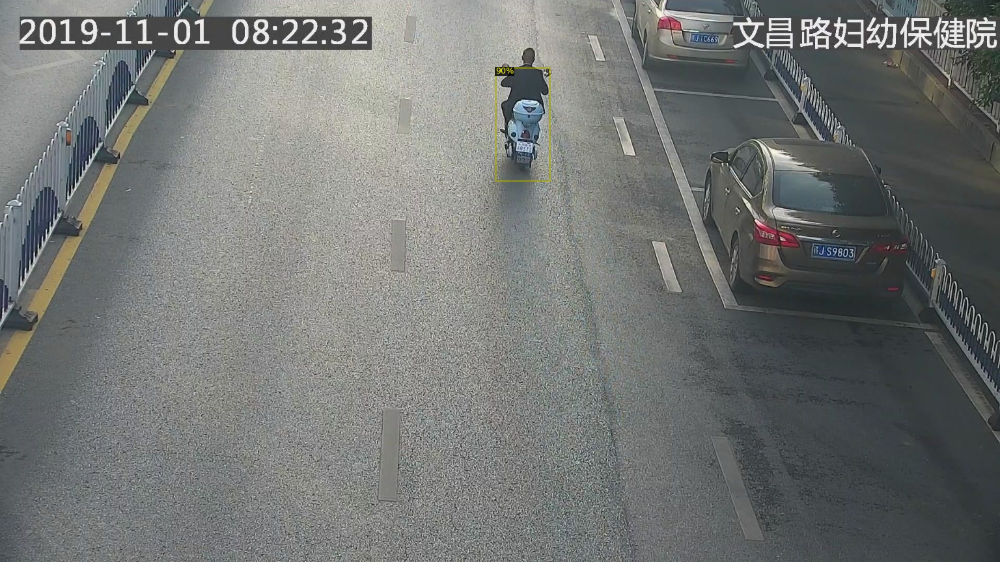

tensor([0], device='cuda:0')
Boxes(tensor([[1034.4352,  107.6615, 1147.4153,  345.1653]], device='cuda:0'))


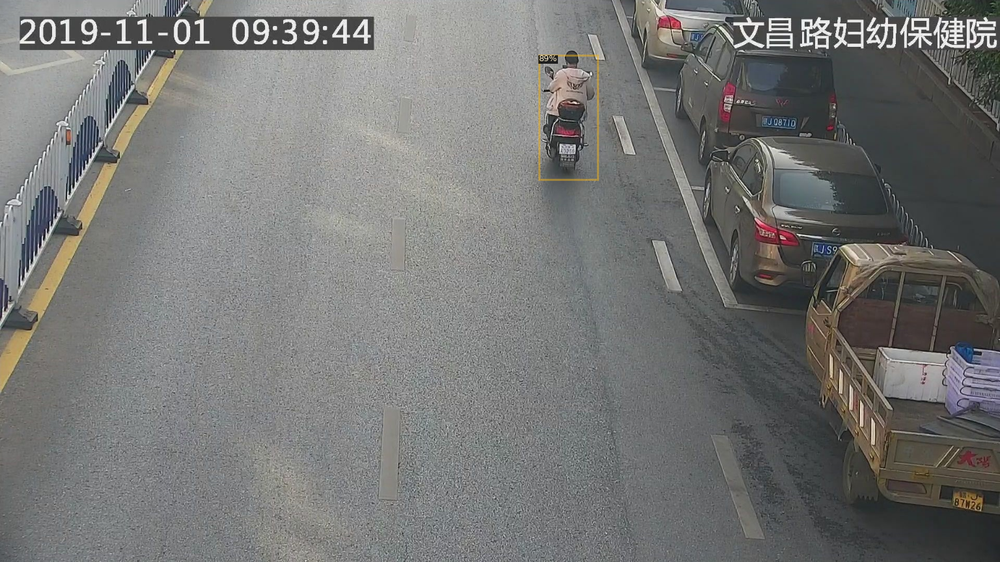

In [9]:
from detectron2.utils.visualizer import ColorMode

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("coco_val_2", )
predictor = DefaultPredictor(cfg)


img_path = "./Coco/detectron2/datasets/coco/val/"
files = os.listdir("./Coco/detectron2/datasets/coco/val")
i = 0 

#load some pics from image_val to test
for file in files:
    if i > 3:
        break
    img = os.path.join(img_path,file)
    im = cv2.imread(img)
    outputs = predictor(im)
    print(outputs["instances"].pred_classes)
    print(outputs["instances"].pred_boxes)
    
    v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
    i += 1

# #from detectron2.utils.visualizer import ColorMode
# dataset_dicts = load_coco_json("/home/xuyifei/anaconda3/envs/detectron2/lib/python3.7/site-packages/detectron2/datasets/coco/annotations/instances_val.json", "/home/xuyifei/anaconda3/envs/detectron2/lib/python3.7/site-packages/detectron2/datasets/coco/val")
# for d in random.sample(dataset_dicts, 3):    
#     im = cv2.imread(d["file_name"])
#     outputs = predictor(im)
#     v = Visualizer(im[:, :, ::-1],
#                    metadata=coco_train_metadata, 
#                    scale=0.8, 
#                    instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
#     )
#     out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
#     cv2_imshow(out.get_image()[:, :, ::-1])


In [10]:
print(os.getcwd())
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("coco_val_2",cfg,True,output_dir="./output")
val_loader = build_detection_test_loader(cfg, "coco_val_2")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test
# another equivalent way is to use trainer.test

/home/xuyifei/桌面/jupter env/Try_2
['coco_val_2']
coco_val_2
[07/10 12:39:22 d2.data.datasets.coco]: Loaded 286 images in COCO format from ./Coco/detectron2/datasets/coco/annotations/instances_val.json
[07/10 12:39:22 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| motorcycle | 554          |
|            |              |
[07/10 12:39:22 d2.data.common]: Serializing 286 elements to byte tensors and concatenating them all ...
[07/10 12:39:22 d2.data.common]: Serialized dataset takes 0.14 MiB
[07/10 12:39:22 d2.evaluation.evaluator]: Start inference on 286 images
[07/10 12:39:24 d2.evaluation.evaluator]: Inference done 11/286. 0.1072 s / img. ETA=0:00:29
[07/10 12:39:29 d2.evaluation.evaluator]: Inference done 58/286. 0.1073 s / img. ETA=0:00:24
[07/10 12:39:34 d2.evaluation.evaluator]: Inference done 104/286. 0.1075 s / img. ETA=0:00:19
[07/10 12:39:39 d2.evaluation.evaluator]: Inference done 150/286. 0.1077 

OrderedDict([('bbox',
              {'AP': 46.500751032518004,
               'AP50': 84.21317210865422,
               'AP75': 46.15414752820252,
               'APs': nan,
               'APm': 18.080841922172112,
               'APl': 49.673085551783906})])